<a href="https://colab.research.google.com/github/KhuzaimaHassan/AI-and-ES/blob/main/lab10_AIES.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Loading Required Libraries
import torch
import cv2
from matplotlib import pyplot as plt
import numpy as np

In [ ]:
# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # Use 'yolov5s', 'yolov5m', 'yolov5l', or 'yolov5x' for different sizes

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-11-15 Python-3.10.12 torch-2.5.0+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
# Function to detect objects in an image
def detect_objects(image, conf_thresh=0.4, iou_thresh=0.4):
    # Perform inference
    results = model(image)

    # Extract bounding boxes, confidences, and class IDs
    boxes = results.xyxy[0].cpu().numpy()  # x1, y1, x2, y2, conf, class
    filtered_boxes = boxes[boxes[:, 4] > conf_thresh]  # Filter based on confidence threshold

    # Apply Non-Maximum Suppression (NMS)
    x1, y1, x2, y2, conf, cls = filtered_boxes[:, 0], filtered_boxes[:, 1], filtered_boxes[:, 2], filtered_boxes[:, 3], filtered_boxes[:, 4], filtered_boxes[:, 5]
    indices = cv2.dnn.NMSBoxes(bboxes=np.column_stack((x1, y1, x2 - x1, y2 - y1)).tolist(), scores=conf.tolist(), score_threshold=conf_thresh, nms_threshold=iou_thresh).flatten()

    # Return the filtered and suppressed bounding boxes
    return filtered_boxes[indices]

# Function to print the detected objects
def print_objects(boxes, class_names):
    for box in boxes:
        x1, y1, x2, y2, conf, class_id = box
        print(f"Detected {class_names[int(class_id)]} with confidence {conf:.2f}")

# Function to plot bounding boxes on the image
def plot_boxes(image, boxes, class_names, plot_labels=True):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    ax = plt.gca()

    for box in boxes:
        x1, y1, x2, y2, conf, class_id = box
        # Draw rectangle and text on the image
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        if plot_labels:
            plt.text(x1, y1 - 10, f"{class_names[int(class_id)]}: {conf:.2f}", color='red', fontsize=12, weight='bold', backgroundcolor='white')

    plt.axis('off')
    plt.show()

# Load and prepare the image
img_path = '/content/city_scene.jpg'
img = cv2.imread(img_path)
if img is None:
    raise ValueError("Image not found or path is incorrect")

# Convert to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Perform object detection
boxes = detect_objects(original_image)

# Print detected objects
class_names = model.names
print_objects(boxes, class_names)

# Plot the image with bounding boxes
plot_boxes(original_image, boxes, class_names)

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Detected person with confidence 0.85
Detected traffic light with confidence 0.75
Detected person with confidence 0.75
Detected car with confidence 0.73
Detected car with confidence 0.72
Detected person with confidence 0.70
Detected truck with confidence 0.68
Detected traffic light with confidence 0.66
Detected car with confidence 0.61
Detected person with confidence 0.59
Detected person with confidence 0.57
Detected traffic light with confidence 0.56
Detected traffic light with confidence 0.52
Detected person with confidence 0.51
Detected person with confidence 0.49
Detected traffic light with confidence 0.48
Detected person with confidence 0.46


In [ ]:
plt.savefig('/content/output.jpg')


0: 448x640 10 persons, 2 sports balls, 187.4ms
Speed: 7.2ms preprocess, 187.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


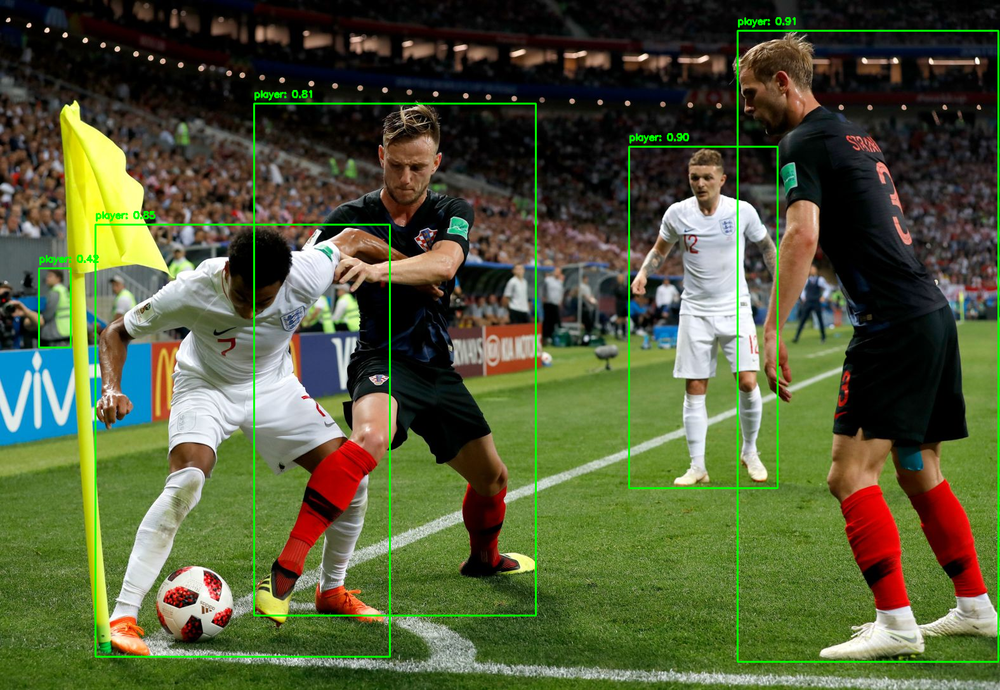

In [ ]:
# prompt: Design a YOLO-based system for Football Analysis in Python with Yolov8 & OpenCV

!pip install ultralytics
!pip install opencv-python
from ultralytics import YOLO
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the YOLOv8 model (replace with your own trained model path)
model = YOLO("yolov8n.pt")  # Load a pretrained YOLOv8n model

# Function to perform object detection
def detect_objects(frame, conf_thresh=0.4, iou_thresh=0.4):
  results = model(frame)
  boxes = []
  for result in results:
    for box in result.boxes:
      x1, y1, x2, y2 = box.xyxy[0]
      conf = box.conf[0]
      cls = box.cls[0]
      if conf > conf_thresh:
          boxes.append([int(x1), int(y1), int(x2), int(y2), conf, int(cls)])

  # Apply Non-Maximum Suppression
  if boxes:
      x1, y1, x2, y2, conf, cls = np.array(boxes).T
      indices = cv2.dnn.NMSBoxes(bboxes=np.column_stack((x1, y1, x2 - x1, y2 - y1)).tolist(), scores=conf.tolist(), score_threshold=conf_thresh, nms_threshold=iou_thresh).flatten()
      return np.array(boxes)[indices]

  return []


# Function to draw bounding boxes and labels on the frame
def draw_boxes(frame, boxes, class_names):
    for x1, y1, x2, y2, conf, cls in boxes:
        cls = int(cls)  # Ensure `cls` is an integer
        if cls < 0 or cls >= len(class_names):
            print(f"Warning: Detected invalid class index {cls}. Skipping.")
            continue  # Skip invalid indices

        label = f"{class_names[cls]}: {float(conf):.2f}"
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return frame




# Load class names (customize based on your dataset)
class_names = ['player', 'ball', 'referee'] # Example class names

# Example of using the functions with a video or image:

# For video:
# cap = cv2.VideoCapture("your_video.mp4")  # Replace with your video path

# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break

#     boxes = detect_objects(frame)
#     frame_with_boxes = draw_boxes(frame, boxes, class_names)
#     cv2.imshow("Football Analysis", frame_with_boxes)
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break

# cap.release()
# cv2.destroyAllWindows()




0: 480x640 2 persons, 1 sports ball, 211.6ms
Speed: 5.3ms preprocess, 211.6ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


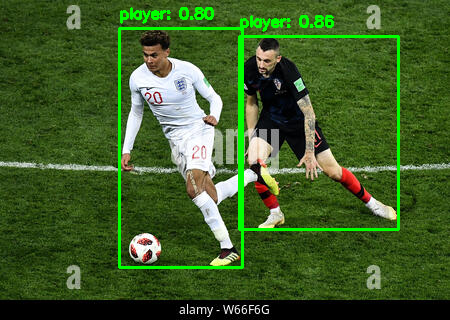

In [ ]:
# For image:
img = cv2.imread("football_image1.jpg")  # Replace with your image path
boxes = detect_objects(img)
img_with_boxes = draw_boxes(img, boxes, class_names)
cv2_imshow( img_with_boxes)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 448x640 10 persons, 2 sports balls, 188.2ms
Speed: 10.3ms preprocess, 188.2ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


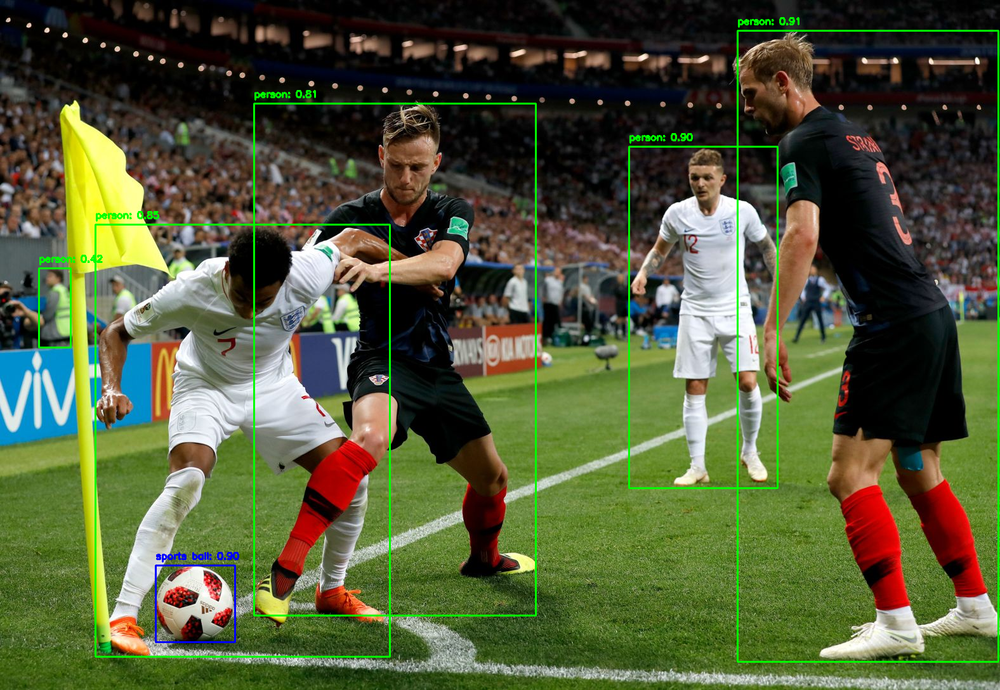

In [ ]:
# Install necessary packages
!pip install ultralytics opencv-python
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

# Load the pre-trained YOLOv8 model
model = YOLO("yolov8n.pt")  # YOLOv8n pretrained on COCO dataset

# Define the class indices for "person" and "sports ball" in COCO
class_names = model.names  # Load all class names
target_classes = ["person", "sports ball"]  # Detect players and football

# Function to filter detections for specific classes
def detect_football_and_players(image, conf_thresh=0.4):
    results = model(image)  # Run YOLOv8 on the input image
    filtered_boxes = []

    for result in results:
        for box in result.boxes:
            conf = box.conf[0]
            cls = int(box.cls[0])  # Class index
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates

            # Only keep detections for "person" and "sports ball"
            if conf > conf_thresh and class_names[cls] in target_classes:
                filtered_boxes.append((x1, y1, x2, y2, conf, class_names[cls]))

    return filtered_boxes

# Function to draw bounding boxes and labels on the image
def draw_detections(image, detections):
    for x1, y1, x2, y2, conf, cls_name in detections:
        label = f"{cls_name}: {conf:.2f}"
        color = (0, 255, 0) if cls_name == "person" else (255, 0, 0)  # Green for players, Blue for football
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return image

# Load and preprocess an input image
image_path = "football_image.jpg"  # Replace with the path to your image
image = cv2.imread(image_path)

# Detect football and players
detections = detect_football_and_players(image)

# Draw the detections on the image
output_image = draw_detections(image, detections)

# Display the image with detections
cv2_imshow(output_image)
cv2.waitKey(0)
cv2.destroyAllWindows()



0: 480x640 2 persons, 1 sports ball, 182.3ms
Speed: 4.7ms preprocess, 182.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


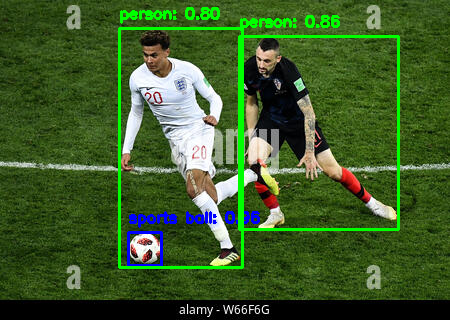

In [ ]:
# Load and preprocess an input image
image_path = "football_image1.jpg"  # Replace with the path to your image
image = cv2.imread(image_path)

# Detect football and players
detections = detect_football_and_players(image)

# Draw the detections on the image
output_image = draw_detections(image, detections)

# Display the image with detections
cv2_imshow(output_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
# Install necessary packages
!pip install ultralytics opencv-python matplotlib
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the YOLOv8 model
model = YOLO("yolov8n.pt")  # Pretrained model on COCO




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.2/887.2 kB 10.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 80.2MB/s]



0: 448x640 6 persons, 1 sports ball, 241.1ms
Speed: 4.9ms preprocess, 241.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
Detected person with confidence 0.90
Detected person with confidence 0.90
Detected person with confidence 0.86
Detected sports ball with confidence 0.83
Detected person with confidence 0.79
Detected person with confidence 0.41


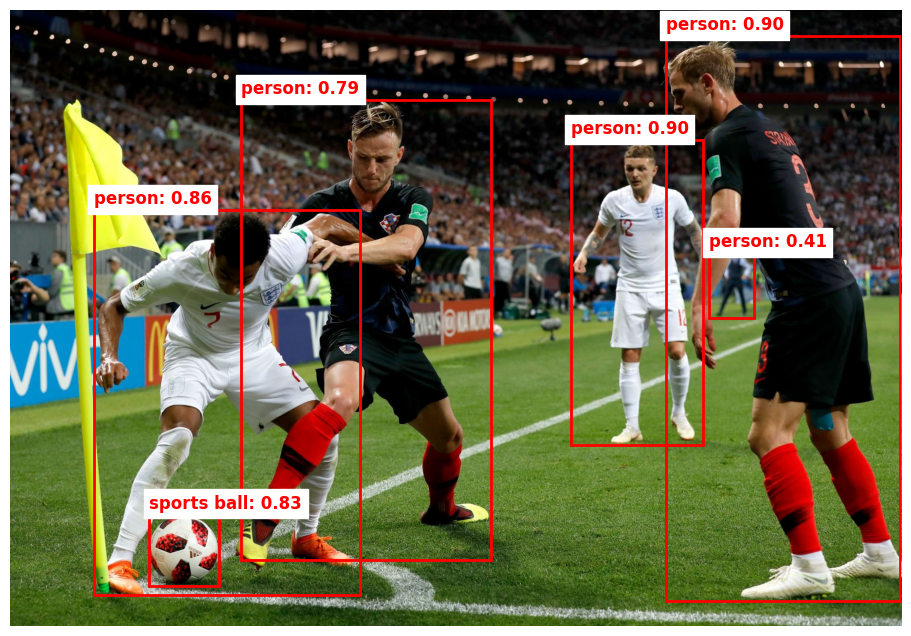

In [ ]:
# Function to detect objects
def detect_objects(image, conf_thresh=0.4, iou_thresh=0.4):
    results = model(image)
    boxes = []

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            cls = int(box.cls[0])

            if conf > conf_thresh:
                boxes.append([x1, y1, x2, y2, conf, cls])

    if not boxes:
        return []

    boxes = np.array(boxes)
    x1, y1, x2, y2, conf, cls = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3], boxes[:, 4], boxes[:, 5]

    indices = cv2.dnn.NMSBoxes(
        bboxes=np.column_stack((x1, y1, x2 - x1, y2 - y1)).tolist(),
        scores=conf.tolist(),
        score_threshold=conf_thresh,
        nms_threshold=iou_thresh
    ).flatten()

    return boxes[indices]

# Function to print detected objects
def print_objects(boxes, class_names):
    for box in boxes:
        x1, y1, x2, y2, conf, class_id = box
        print(f"Detected {class_names[int(class_id)]} with confidence {conf:.2f}")

# Function to plot bounding boxes on the image
def plot_boxes(image, boxes, class_names, plot_labels=True):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    ax = plt.gca()

    for box in boxes:
        x1, y1, x2, y2, conf, class_id = box
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        if plot_labels:
            plt.text(x1, y1 - 10, f"{class_names[int(class_id)]}: {conf:.2f}", color='red', fontsize=12, weight='bold', backgroundcolor='white')

    plt.axis('off')
    plt.show()

# Load and prepare the image
img_path = "football_image.jpg"
img = cv2.imread(img_path)
if img is None:
    raise ValueError("Image not found or path is incorrect")

# Convert to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Perform object detection
boxes = detect_objects(original_image)

# Print detected objects
class_names = model.names
print_objects(boxes, class_names)

# Plot the image with bounding boxes
plot_boxes(original_image, boxes, class_names)


0: 480x640 2 persons, 1 sports ball, 273.8ms
Speed: 6.8ms preprocess, 273.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
Detected sports ball with confidence 0.97
Detected person with confidence 0.90
Detected person with confidence 0.82


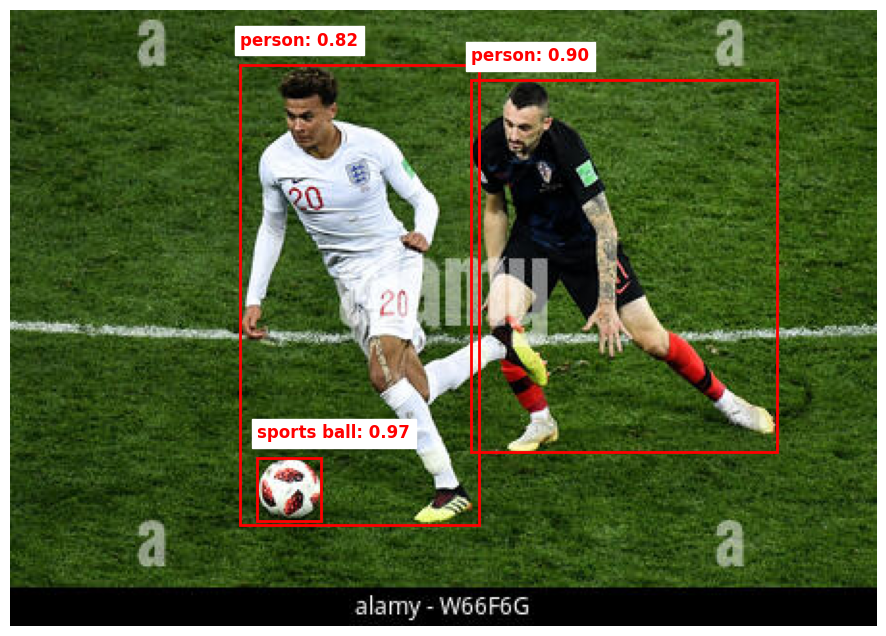

In [ ]:
# Load and prepare the image
img_path = "football_image1.jpg"
img = cv2.imread(img_path)
if img is None:
    raise ValueError("Image not found or path is incorrect")

# Convert to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Perform object detection
boxes = detect_objects(original_image)

# Print detected objects
class_names = model.names
print_objects(boxes, class_names)

# Plot the image with bounding boxes
plot_boxes(original_image, boxes, class_names)


0: 384x640 3 persons, 1 sports ball, 201.5ms
Speed: 7.8ms preprocess, 201.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Detected person with confidence 0.90
Detected sports ball with confidence 0.90
Detected person with confidence 0.87


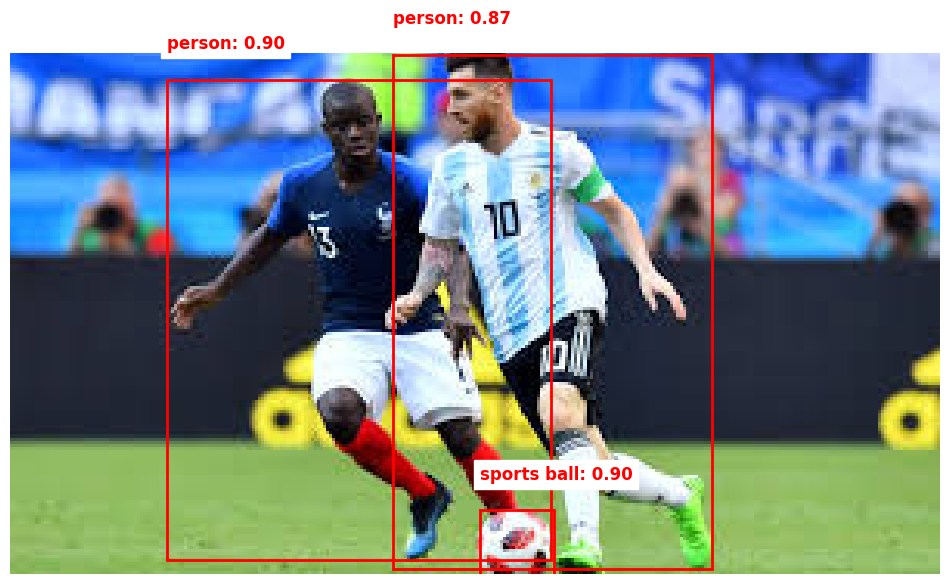

In [ ]:
# Load and prepare the image
img_path = "football_image3.jpeg"
img = cv2.imread(img_path)
if img is None:
    raise ValueError("Image not found or path is incorrect")

# Convert to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Perform object detection
boxes = detect_objects(original_image)

# Print detected objects
class_names = model.names
print_objects(boxes, class_names)

# Plot the image with bounding boxes
plot_boxes(original_image, boxes, class_names)

In [ ]:
from google.colab.patches import cv2_imshow
# Function to detect objects in a frame
def detect_objects(frame, conf_thresh=0.4, iou_thresh=0.4):
    results = model(frame)  # Perform inference
    boxes = []

    for result in results:  # Iterate through results
        for box in result.boxes:
            # Ensure all necessary values are extracted
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
            conf = box.conf[0].item()  # Confidence score
            cls = int(box.cls[0])  # Class index

            if conf > conf_thresh:  # Filter by confidence threshold
                boxes.append([x1, y1, x2, y2, conf, cls])

    if not boxes:
        return np.array([])  # Return an empty array if no boxes

    # Convert to numpy array and ensure six columns
    boxes = np.array(boxes)
    return boxes

# Function to draw bounding boxes on a frame
def draw_boxes(frame, boxes, class_names):
    for box in boxes:
        # Properly unpack the six expected elements
        x1, y1, x2, y2, conf, class_id = box
        color = (0, 255, 0) if class_names[int(class_id)] == "person" else (255, 0, 0)  # Green for players, Blue for football
        label = f"{class_names[int(class_id)]}: {conf:.2f}"
        # Convert coordinates to integers before using OpenCV
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return frame

# Process video
def process_video(video_path, output_path, conf_thresh=0.4, iou_thresh=0.4):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError("Error opening video file.")

    # Video writer setup
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    class_names = model.names  # COCO class names
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Perform object detection
        boxes = detect_objects(frame, conf_thresh, iou_thresh)

        # Debugging: Print the detected boxes
        print(f"Detected boxes: {boxes}")

        # Draw bounding boxes
        frame = draw_boxes(frame, boxes, class_names)

        # Write the frame to the output video
        out.write(frame)

        # # Display the frame (optional, for visualization)
        # cv2_imshow(frame)
        # if cv2.waitKey(1) & 0xFF == ord("q"):  # Press 'q' to quit
        #     break

    # cap.release()
    # out.release()
    # cv2.destroyAllWindows()

# Set input and output video paths
video_path = "football.mp4"  # Replace with your input video path
output_path = "/content/footballprocessed.mp4"  # Replace with your desired output video path

# Process the video
process_video(video_path, output_path)


Streaming output truncated to the last 5000 lines.
 [        434         348         465         432      0.5461           0]
 [        379         301         414         374     0.54145           0]
 [        380         278         419         371     0.45445           0]]

0: 384x640 17 persons, 141.6ms
Speed: 5.6ms preprocess, 141.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Detected boxes: [[        719         453         762         552     0.86377           0]
 [       1175         619        1218         720     0.79727           0]
 [       1009         214        1047         295     0.78803           0]
 [        408         454         454         527     0.78422           0]
 [        351         423         397         508     0.77635           0]
 [        856         568         895         682     0.76547           0]
 [        333         307         381         383     0.74958           0]
 [        634         255         659         333   

In [ ]:
# Install necessary packages
!pip install ultralytics opencv-python matplotlib

from ultralytics import YOLO
import cv2
import numpy as np

# Load the YOLOv8 model fine-tuned for traffic sign detection
model = YOLO("yolov8n.pt")
# Function to detect traffic signs in a frame
def detect_objects(frame, conf_thresh=0.4, iou_thresh=0.4):
    results = model(frame)  # Perform inference
    boxes = []

    for result in results:  # Iterate through results
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
            conf = box.conf[0].item()  # Confidence score
            cls = int(box.cls[0])  # Class index

            if conf > conf_thresh:  # Filter by confidence threshold
                boxes.append([x1, y1, x2, y2, conf, cls])

    if not boxes:
        return np.array([])  # Return an empty array if no boxes

    # Convert to numpy array and ensure six columns
    boxes = np.array(boxes)
    return boxes

# Function to draw bounding boxes on a frame
def draw_boxes(frame, boxes, class_names):
    for box in boxes:
        x1, y1, x2, y2, conf, class_id = box
        color = (0, 255, 0)  # Green for detected traffic signs
        label = f"{class_names[int(class_id)]}: {conf:.2f}"
        # Convert coordinates to integers before using OpenCV
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return frame

# Process video
def process_video(video_path, output_path, conf_thresh=0.4, iou_thresh=0.4):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError("Error opening video file.")

    # Video writer setup
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    class_names = model.names  # Traffic sign class names
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Perform object detection
        boxes = detect_objects(frame, conf_thresh, iou_thresh)

        # Draw bounding boxes
        frame = draw_boxes(frame, boxes, class_names)

        # Write the frame to the output video
        out.write(frame)

    #     # Display the frame (optional, for visualization)
    #     cv2.imshow("Traffic Sign Detection", frame)
    #     if cv2.waitKey(1) & 0xFF == ord("q"):  # Press 'q' to quit
    #         break

    # cap.release()
    # out.release()
    # cv2.destroyAllWindows()

# Set input and output video paths
video_path = "/content/Traffic.mp4"  # Replace with your input video path
output_path = "/content/traffic-sign-output.mp4"  # Replace with your desired output video path

# Process the video
process_video(video_path, output_path)



0: 384x640 3 persons, 1 bicycle, 8 cars, 3 traffic lights, 153.0ms
Speed: 5.1ms preprocess, 153.0ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 8 cars, 2 traffic lights, 138.0ms
Speed: 4.6ms preprocess, 138.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 8 cars, 2 traffic lights, 142.5ms
Speed: 4.9ms preprocess, 142.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 9 cars, 2 traffic lights, 139.5ms
Speed: 6.2ms preprocess, 139.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 9 cars, 2 traffic lights, 159.2ms
Speed: 5.3ms preprocess, 159.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 1 bicycle, 3 cars, 3 traffic lights, 1 stop sign, 144.5ms
Speed: 4.9ms preprocess, 144.5ms inference, 1.1ms postprocess per image at shape (1, 3, 3